# Table of Contents

* [Libraries](#chapter1)
* [Technical analysis of stocks using R](#chapter2)
    * [Some definitions](#Section_2_1)
    * [Data visualisation](#Section_2_2)
        * [Scatter Plot for closing prices](#section_2_2_1)
        * [Candlestick Charts for high/low closing prices](#section_2_2_2)
        * [Scatter Plot for volumes of shares](#section_2_2_3)
        * [Bar Charts for volume of trades in a day-trade](#section_2_2_4)
        * [Histogram for return of investing](#section_2_2_5)
    *[More technical analisys](#Section_1_3)
        * [Multi-Line Chart for daily price](#section_2_3_1)
        * [Bollinger band chart](#section_2_3_2)
*[Drawing correlations between shares of different assets](#chapter3)
*[Stock price simulation and predictive methods](#chapter4)
    * [Random walk](#Section_4_1)
    * [Monte Carlo historical simulation](#Section_4_2)
    * [Implementation of Predictive Analytics in Stock Prices](#Section_4_3)
        * [Augmented Dickey-Fuller Test for Stationarity](#section_4_3_1)
        * [Seasonality in Time Series Data](#section_4_3_2)
        * [Autocorrelation and Partial Correlation](#section_4_3_3)
        * [ARIMA - Autoregresive Integrating Moving Average](#section_4_3_4)
        * [Comparing predictions with Actual Stock Prices](#section_4_3_5)
*[Building a Portfolio of Stocks](#chapter5)
    * [Sharpe Ratio](#Section_5_1)
        * [Portfolio Sharpe Ratio](#section_5_1_1)
        * [Improving the Sharpe Ratio](#section_5_1_2)
    * [The penalty function method](#Section_5_2)
        * [Building the penalty function according to the constraints](#section_5_2_1)
    * [Genetic algorithm](#Section_5_3)
        * [Portfolio returns](#section_5_3_1)
        * [Objective function with penalty](#section_5_3_2)
        * [Optimization](#section_5_3_3)
*[Conclusion, Summary and Learnings](#chapter6)
*[Bibliography](#chapter7)

## Libraries <a class="anchor" id="chapter1"></a>

In [1]:
#install.packages('quantmod', repos='https://cran.r-project.org')

In [2]:
library(quantmod)
library(xts)
library(rvest)
library(tidyverse)
library(stringr)
library(forcats)
library(lubridate)
library(plotly)
library(dplyr)
library(PerformanceAnalytics)
library(dygraphs)
library(tidyquant)
library(forecast)
library(tseries)
library(GA)
library(parallel)
library(doParallel)

Loading required package: xts

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric


Loading required package: TTR

Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.8     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()         masks stats::filter()
✖ dplyr::first()          masks xts::first()
✖ readr::guess_encoding() masks rvest::guess_encoding()
✖ dplyr::lag()            masks stats::lag()
✖ dplyr::las

## Technical analysis of stocks using R <a class="anchor" id="chapter2"></a>

I will study Google stock (ticker: GOOGL), to do so I am gathering wotrh data sourcing it from Yahoo finance, for the last 6 years. But why?

No trading algorithm can function optimally on only few months of data.


In [3]:
options(repr.plot.width=15, repr.plot.height=10)
#load company stocks from yahoo finance
#taking last 6 years annual records
data <- getSymbols("GOOGL", src="yahoo", from="2016-05-22", to="2022-05-22", auto.assign=FALSE)
df = data.frame(date = index(data), data, row.names=NULL)

In [4]:
head(df)

,date,GOOGL.Open,GOOGL.High,GOOGL.Low,GOOGL.Close,GOOGL.Volume,GOOGL.Adjusted
,<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2016-05-23,35.9990,36.1750,35.8470,35.8625,24816000,35.8625
2,2016-05-24,35.9925,36.7100,35.9825,36.6515,37884000,36.6515
3,2016-05-25,36.7500,36.9945,36.6300,36.9050,32216000,36.9050
4,2016-05-26,36.8000,37.0550,36.6500,36.8465,27202000,36.8465
5,2016-05-27,36.8755,37.3955,36.8505,37.3800,34802000,37.3800
6,2016-05-31,37.4380,37.6740,37.2785,37.4425,42484000,37.4425


### Some definitions<a class="anchor" id="section_2_1"></a>

#### Open: 
the price at which a stock started trading when the opening bell rang.

It can be the same as where the stock closed the night before, but not always. Sometimes events such as company earnings reports in after-hours trading can alter a stock’s price overnight.

#### Close:
refers to the price of an individual stock when the stock exchange closed shop for the day.

It represents the last buy-sell order executed between two traders. This occurs in the final seconds of the trading day in many cases.

While much fanfare surrounds the stock market’s opening bell and opening prices, a stock’s closing price determines how a share performs during the day.

#### High:
highest price at which a stock is traded during a period.

#### Low:
lowest price of the period.

#### Adjusted:
Let’s say a company pays a quarterly dividend in cash or additional shares of stock. We can incorporate these into the share price by adding them back with an adjusted value that reflects the shareholder payments. Although dividends are a welcomed bonus for shareholders, they lower a stock’s value.

By distributing dividends, a company moves cash or stock to shareholders’ pockets rather than investing the funds back into the business.

A company may also decide to issue additional shares of stock to raise capital for growth projects, debt repayment, or acquisitions. 
These actions affect a company’s value, and the adjusted price may drop or increase depending on how investors perceive how the company will invest the new funds.

#### Volume:
total number of shares traded in a security period.

Every time buyers and sellers exchange shares, the amount gets added to the period’s total volume. Studying volume patterns are an essential aspect of technical analysis because it can show the significance of a stock’s price movement.

A price change that occurs in high volume can carry more weight because it indicates that many traders were behind the move.

### Data visualisation<a class="anchor" id="section_2_2"></a>

In the next sections, I will walk through some plots to study the basic trends in the market revolving around Google and others relevant companies. 

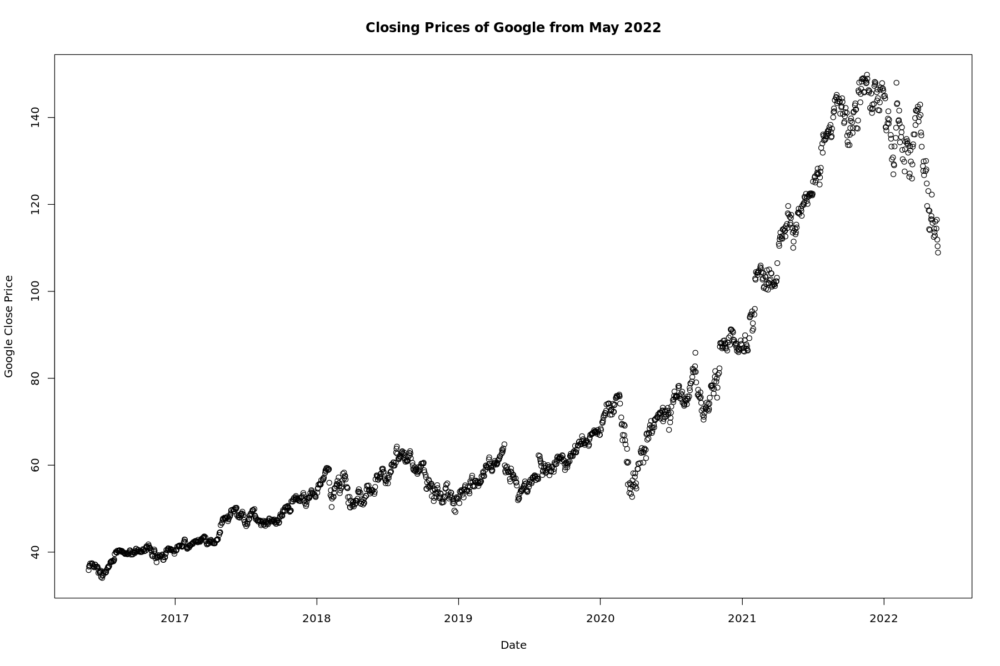

In [5]:
plot(df$GOOGL.Close, main = "Closing Prices of Google from May 2022", ylab="Google Close Price", x=df$date, xlab="Date")

#### Scatter Plot for closing prices<a class="anchor" id="section_2_2_1"></a>

The above visual shows the closing prices of the stock in the last 6 years. 
It is clearly that Google stocks, with some minor falls, increased their values over the last years, at least until the dawn of 2022, when the shrinking in the real economies caused a brake in the expansion of the financial market. 

In [6]:
#created using plotly with interactive features
cs_chart <- df %>%
  plot_ly(x = ~df$date, type="candlestick",
          open = ~df$GOOGL.Open, close = ~df$GOOGL.Close, high = ~df$GOOGL.High, low = ~df$GOOGL.Low) %>%
    layout(title = 'Google', plot_bgcolor = "#e5ecf6", xaxis = list(title = 'Dates'), 
         yaxis = list(title = 'Pricing Data'))
cs_chart

HTML widgets cannot be represented in plain text (need html)

#### Candlestick Charts for high/low closing prices<a class="anchor" id="section_2_2_2"></a>

It gives day traders a detailed reading of how the stock performed every day which in turn speaks about the market's sentiment with regard to the stock. 

In the case of Google, we see an evenly distributed chart which tells that investors are stable about trading the company stocks.


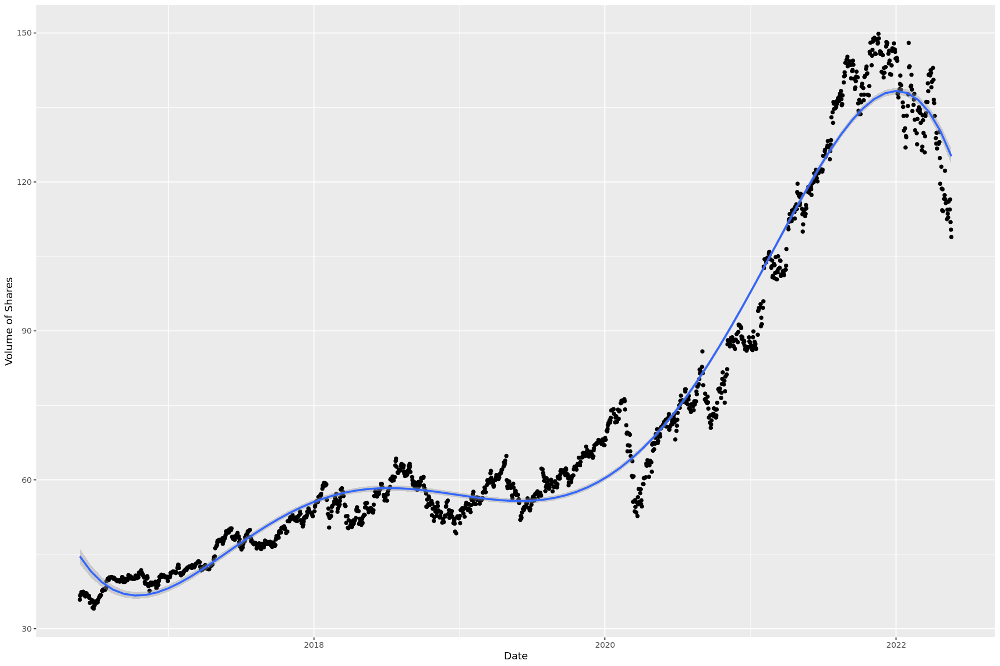

In [7]:
ggplot(df, aes(x=date, y=GOOGL.Adjusted)) + geom_point() + stat_smooth(
                                                                      geom = "smooth",
                                                                      method = "glm",
                                                                      formula = y ~ poly(x, 5),
                                                                      se = TRUE,
                                                                      n = 80,
                                                                      span = 0.75,
                                                                      level = 0.95,
                                                                    ) + xlab("Date") + ylab("Volume of Shares")

#### Scatter Plot for volumes of shares<a class="anchor" id="section_2_2_3"></a>

To study the amount of day trades being executed on a day-to-day basis against adjusted close prices.
This shows a regular periodic rise in the stock price from Google.

`geom_smooth()` using formula 'y ~ x'



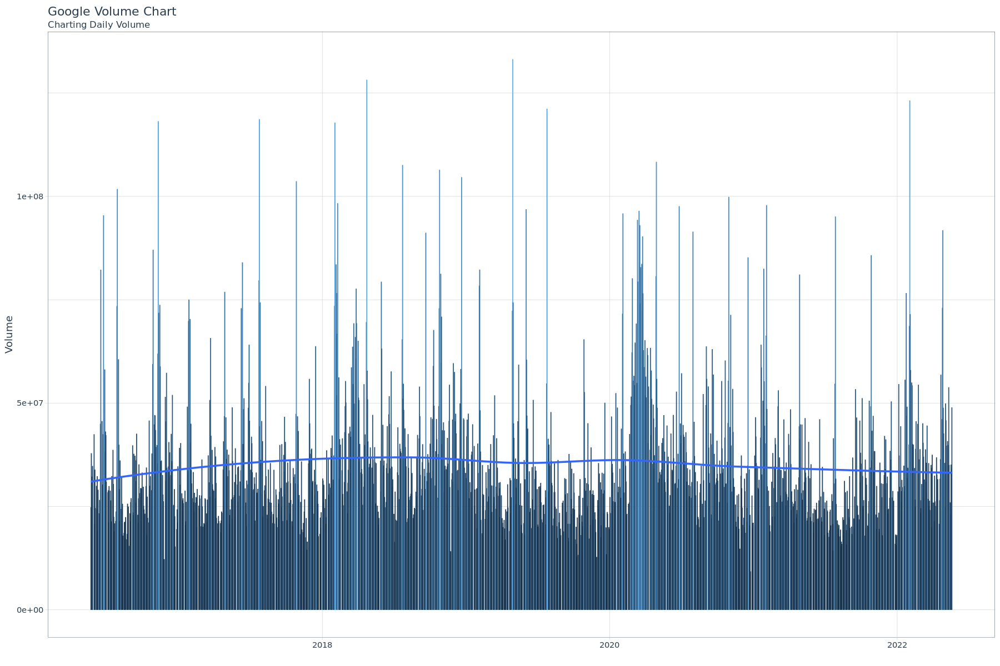

In [8]:
df %>%
    ggplot(aes(x = date, y = GOOGL.Volume)) +
    geom_segment(aes(xend = date, yend = 0, color = GOOGL.Volume)) + 
    geom_smooth(method = "loess", se = FALSE) +
    labs(title = "Google Volume Chart", 
         subtitle = "Charting Daily Volume", 
         y = "Volume", x = "") +
    theme_tq() +
    theme(legend.position = "none") 

#### Bar Charts for volume of trades in a day-trade<a class="anchor" id="section_2_2_4"></a>

The data for GOOGLE shows no trends or patterns of trade volumes, irrespective of price.
This shows us an important aspect about the company's stock, that the investor's trust is not factored or affected by the price of the stock, for this company.


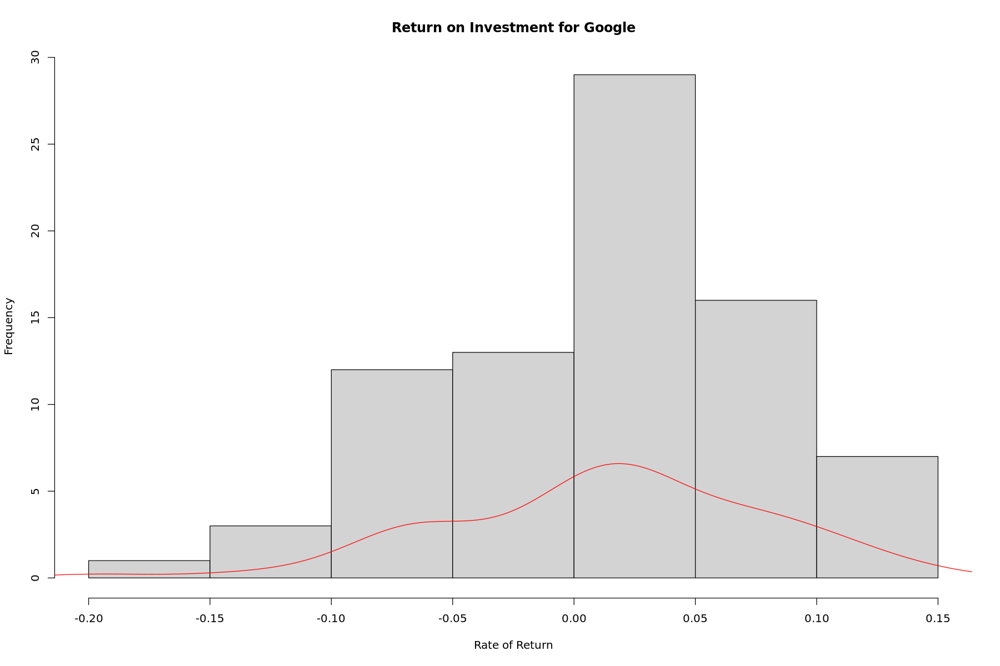

In [9]:
returns <- function(ticker, start_year) 
  {
    symbol <- getSymbols(ticker, src = 'yahoo', auto.assign = FALSE, warnings = FALSE)
    data <- periodReturn(symbol, period = 'monthly', subset=paste(start_year, "::", sep = ""), type = 'log')
    assign(ticker, data, .GlobalEnv)
  }
re = returns('GOOGL', 2016)
hist(re, main= "Return on Investment for Google", xlab="Rate of Return")
lines(density(re), col = "red")

#### Histogram for return of investing<a class="anchor" id="section_2_2_5"></a>
The above graph shows us how the return on investing in Google has been for the last 6 years. 
This rate is important to understand the pattern of growth of the company's stock value. We see that the rate of return widely improved in recent years which shows positive confidence in the stock.


### More technical analysis<a class="anchor" id="Section_2_3"></a>

Warning message:
“Removed 6 row(s) containing missing values (geom_path).”
Warning message:
“Removed 30 row(s) containing missing values (geom_path).”


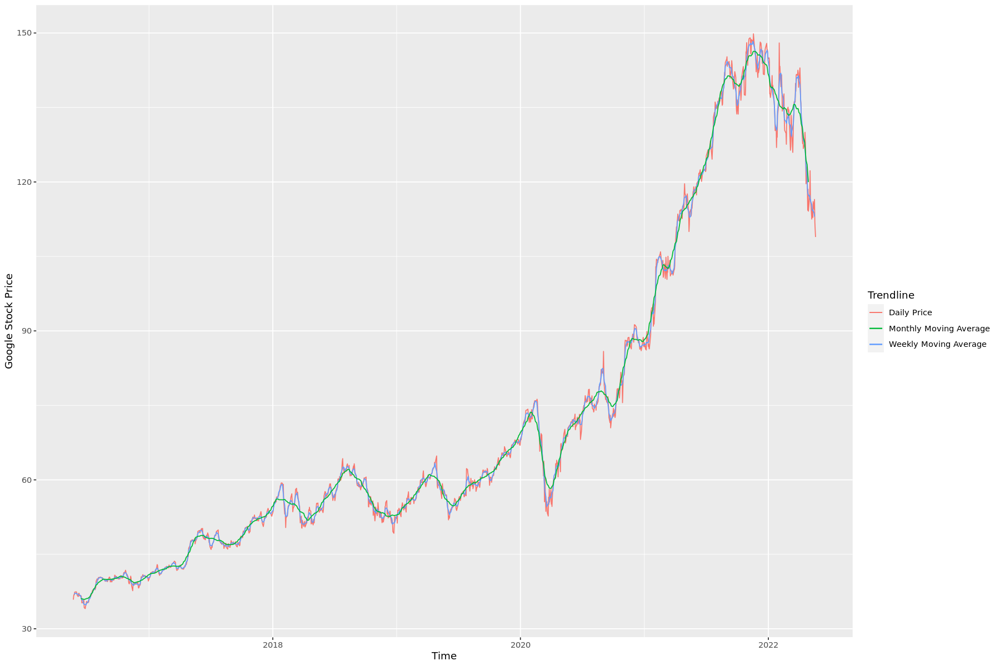

In [10]:
options(repr.plot.width=15, repr.plot.height=10)
df$ma7 = ma(df$GOOGL.Adjusted, order=7)
df$ma30 = ma(df$GOOGL.Adjusted, order=30)
ggplot() +
    geom_line(data = df, aes(x = date, y = GOOGL.Adjusted, color = "Daily Price")) +
    geom_line(data = df, aes(x = date, y = ma7,   color = "Weekly Moving Average"))  +
    geom_line(data = df, aes(x = date, y = ma30, color = "Monthly Moving Average"))  +
    ylab('Google Stock Price') +
    xlab('Time') +
    labs(color = 'Trendline')

#### Multi-Line Chart for daily price<a class="anchor" id="section_2_3_1"></a>
The graph above is bifurcated based on the daily price, a weekly moving average and a monthly moving average.

MA is a significant measure of movement in stock prices that shows a period of volatility.

When the stock prices go strongly above the monthly moving average it is a clear sign of high volatility. These periods could be potential trade opportunities for day traders but come with the "high risk high reward" note.

The moving average is important to understanding Google’s technical charts. It smoothes out daily price fluctuations by averaging stock prices and is effective in identifying potential trends.


[1] "GOOGL"

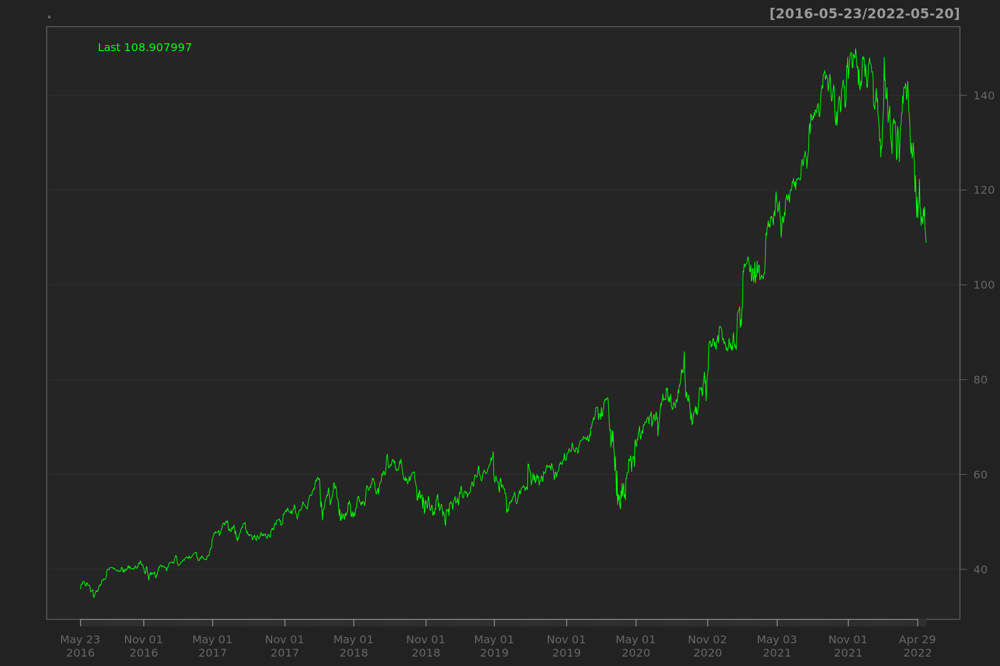

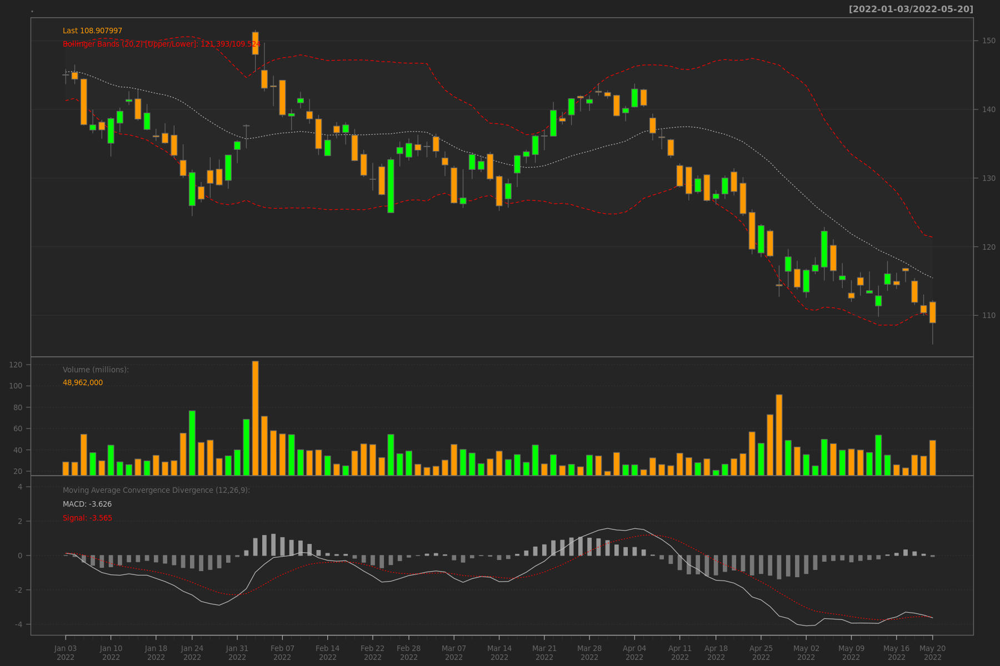

In [11]:
#Load the company stocks from Yahoo Finance
#take the last 6 years annual records

getSymbols("GOOGL",from="2016-05-22",to="2022-05-22",src="yahoo")

GOOGL%>%Ad()%>%chartSeries()
GOOGL%>%chartSeries(TA='addBBands();addVo();addMACD()',subset='2022')

The first chart series graph is straightforward as it shows Google’s price chart.

The second chart series show the Bollinger Band chart, percentage Bollinger change, Volume Traded and Moving Average Convergence Diverence in 2022 alone.

#### Bollinger band chart<a class="anchor" id="section_2_3_2"></a>
A key analysis tool for any security, plots two standard deviations away from the moving average and is used to measure the stock’s volatiliy.

It is comprised of three lines, a simple moving average (middle band), an upper and a lower band. 
The squeeze is an important indicator shown by the Bollinger band. When the bands come close, it is called a squeeze. This indicates that the moving average is constricting. It is period of low volatility and is an indication of future trading opportunities. 

The Volume chart shows how its stocks are traded on the daily. 

The Moving Average Convergence Divergence gives technical analysts buy/sell signals. The rule of thumb is: If it falls below the line, it is time to sell. If it rises above the line, it is experiencing an upward momentum.

The charts above are usually used to decide whether to buy/sell a stock.

## Drawing correlations between shares of different assets<a class="anchor" id="chapter3"></a>

Now we move to the analysis of the stocks from different companies.
Let load the data in the same time window of the previously analysed Google's stocks.

In [12]:
getSymbols("INTC",from="2016-05-22",to="2022-05-22",src="yahoo")
getSymbols("AMZN",from="2016-05-22",to="2022-05-22",src="yahoo")
getSymbols("TSLA",from="2016-05-22",to="2022-05-22",src="yahoo")
getSymbols("AAPL",from="2016-05-22",to="2022-05-22",src="yahoo")

[1] "INTC"

[1] "AMZN"

[1] "TSLA"

[1] "AAPL"

### Compute rolling statistics<a class="anchor" id="Section3_1"></a>

In [13]:
#Logarithmic daily returns

GOOGL_log_returns<-GOOGL%>%Ad()%>%dailyReturn(type='log')
INTC_log_returns<-INTC%>%Ad()%>%dailyReturn(type='log')
AMZN_log_returns<-AMZN%>%Ad()%>%dailyReturn(type='log')
TSLA_log_returns<-TSLA%>%Ad()%>%dailyReturn(type='log')
AAPL_log_returns<-AAPL%>%Ad()%>%dailyReturn(type='log')

#Mean of log stock returns 

GOOGL_mean_log<-mean(GOOGL_log_returns)
INTC_mean_log<-mean(INTC_log_returns)
AMZN_mean_log<-mean(AMZN_log_returns)
TSLA_mean_log<-mean(TSLA_log_returns)
AAPL_mean_log<-mean(AAPL_log_returns)


#Average stock daily return
GOOGL_mean<-mean(GOOGL_log_returns,na.rm=TRUE)
INTC_mean<-mean(INTC_log_returns,na.rm=TRUE)
AMZN_mean<-mean(AMZN_log_returns,na.rm=TRUE)
TSLA_mean<-mean(TSLA_log_returns,na.rm=TRUE)
AAPL_mean<-mean(AAPL_log_returns,na.rm=TRUE)

In [14]:
#standard deviation of log stock returns

GOOGL_sd_log<-sd(GOOGL_log_returns,na.rm=TRUE)
INTC_sd_log<-sd(INTC_log_returns,na.rm=TRUE)
AMZN_sd_log<-sd(AMZN_log_returns,na.rm=TRUE)
TSLA_sd_log<-sd(TSLA_log_returns,na.rm=TRUE)
AAPL_sd_log<-sd(AAPL_log_returns,na.rm=TRUE)

In [15]:
probs<-c(0.005,0.025,0.25,0.5,0.75,0.975,0.995)

GOOGL_dist<-GOOGL_log_returns%>%quantile(probs=probs,na.rm=TRUE)
INTC_dist<-INTC_log_returns%>%quantile(probs=probs,na.rm=TRUE)
AMZN_dist<-AMZN_log_returns%>%quantile(probs=probs,na.rm=TRUE)
TSLA_dist<-TSLA_log_returns%>%quantile(probs=probs,na.rm=TRUE)
AAPL_dist<-AAPL_log_returns%>%quantile(probs=probs,na.rm=TRUE)

In [16]:
#create data frame, contains the five companies avg log ret and std dev
#round up the mean values

mean_log<-c(GOOGL_mean_log,INTC_mean_log,AMZN_mean_log,TSLA_mean_log,AAPL_mean_log)
mean_log<-round(mean_log,5) 
sd_log<-c(GOOGL_sd_log,INTC_sd_log,AMZN_sd_log,TSLA_sd_log,AAPL_sd_log)
sd_log<-round(sd_log,5)
graphic1<-data.frame(mean_log,sd_log)
rownames(graphic1)<-c("GOOGL","INTC","AMZN","TSLA","AAPL")
colnames(graphic1)<-c("Mean_Log_Return", "Sd_Log_Return")

graphic1

,Mean_Log_Return,Sd_Log_Return
,<dbl>,<dbl>
GOOGL,0.00074,0.01700
INTC,0.00032,0.02134
AMZN,0.00075,0.01942
TSLA,0.00181,0.03707
AAPL,0.00120,0.01879


In [17]:
#Used plotly to create a visualization of each stock risk vs reward. 
#Risk: standard deviation of log returns
#Reward: mean of log returns

xlab<-list(title="Reward")
ylab<-list(title="Risk")

plot_ly(x=graphic1[,1],y=graphic1[,2],text=rownames(graphic1),type='scatter',mode="markers",marker=list(color=c("black","blue","red","grey","green")))%>%layout(title="Risk v Reward",xaxis=xlab,yaxis=ylab)


HTML widgets cannot be represented in plain text (need html)

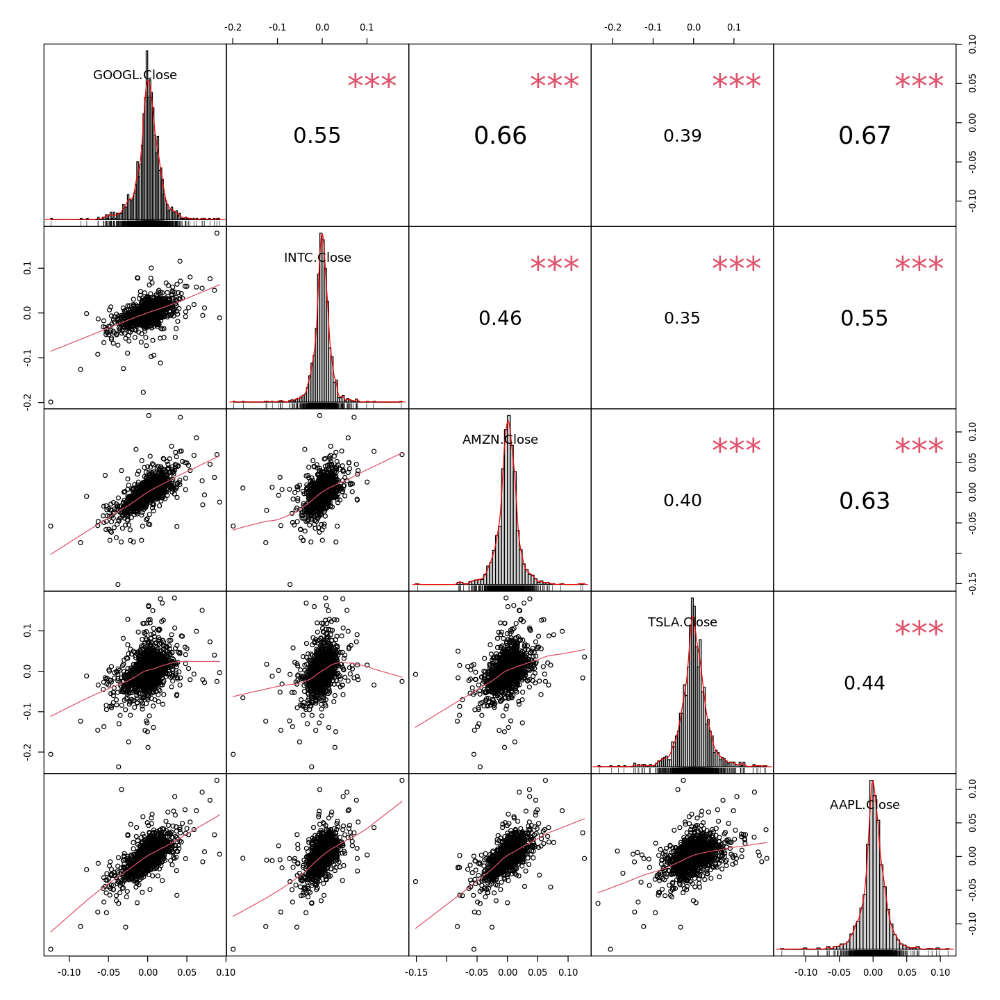

In [18]:
#checking the correlation of the stocks
#we want to set up a portfolio with diversification of investments to reduce the losses

options(repr.plot.width=12, repr.plot.height=12)
data<-cbind(diff(log(Cl(GOOGL))),diff(log(Cl(INTC))),diff(log(Cl(AMZN))),diff(log(Cl(TSLA))),diff(log(Cl(AAPL))))
chart.Correlation(data)

## Stock price simulation  and predictive methods<a class="anchor" id="chapter4"></a>
Stock price prediction with method of historical simulations.

### Random walk<a class="anchor" id="Section_4_1"></a>


Predict stock prices using Geometric Brownian motion.
The random walk theory is suited for a stock’s price prediction because it is rooted in the believe that past performance is not an indicator of future results and price fluctuations can not be predicted with accuracy.

I generated the prices using the data I have earlier from log returns and used exponential growth rate to predict how much the stock will grow per day. The growth rate is randomly generated and dependent on the input values of mu and sigma.

Warning message:
“Removed 8 row(s) containing missing values (geom_path).”


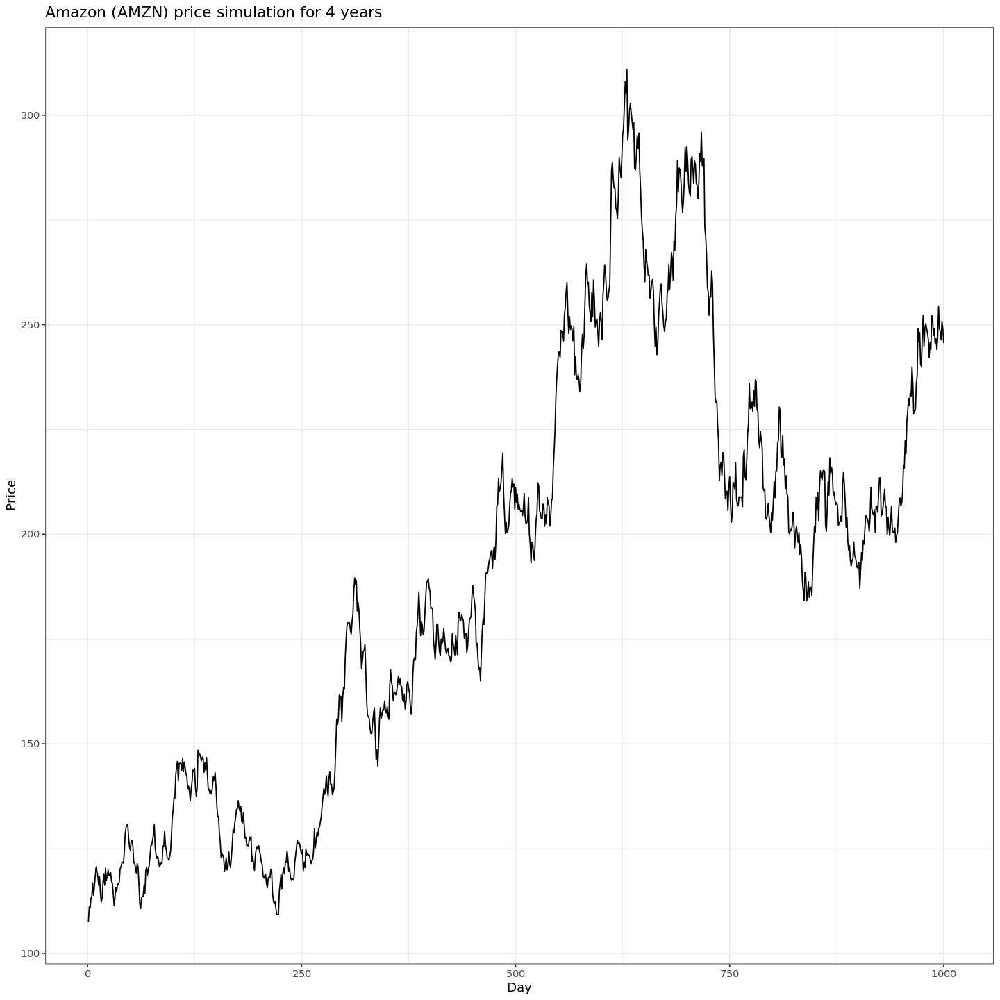

In [19]:
#random walk: Rooted in past performance is not an indicator of future results. Price fluctuations can not be predicted with accuracy

#set.seed(Sys.time())
mu<-AMZN_mean_log
sig<-AMZN_sd_log
testsim<-rep(NA,1000)

#generate random daily exponent increase rate using AMZN's mean and sd log returns

#one year 252 trading days, simulate for 4 years 
# 4*252 trading days

price<-rep(NA,252*4)

#most recent price
price[1]<-as.numeric(AMZN$AMZN.Adjusted[length(AMZN$AMZN.Adjusted),])

#start simulating prices

for(i in 2:length(testsim)){
  price[i]<-price[i-1]*exp(rnorm(1,mu,sig))
}

random_data<-cbind(price,1:(252*4))
colnames(random_data)<-c("Price","Day")
random_data<-as.data.frame(random_data)

random_data%>%ggplot(aes(Day,Price))+geom_line()+labs(title="Amazon (AMZN) price simulation for 4 years")+theme_bw()

### Monte Carlo historical simulation<a class="anchor" id="Section_4_2"></a>

Used to replicate the random walk experiment to come up with a more accurate simulation.

Warning message:
“The `x` argument of `as_tibble.matrix()` must have unique column names if `.name_repair` is omitted as of tibble 2.0.0.
Using compatibility `.name_repair`.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”


[1] 1008  501

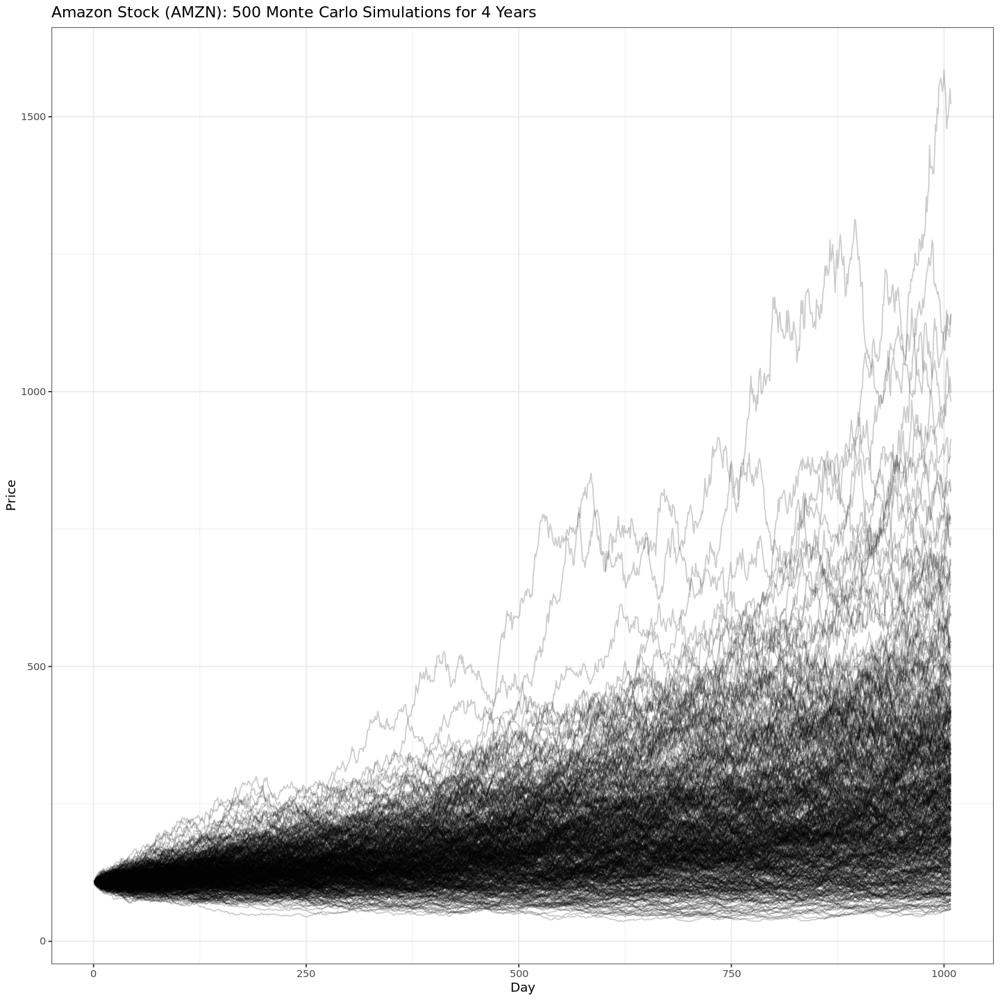

In [20]:
#monte carlo simulation: incredibly useful forecasting tool to predict outcomes of events with many random variables


N<-500
mc_matrix<-matrix(nrow=252*4,ncol=N)
mc_matrix[1,1]<-as.numeric(AMZN$AMZN.Adjusted[length(AMZN$AMZN.Adjusted),])

for(j in 1:ncol(mc_matrix)){
  mc_matrix[1,j]<-as.numeric(AMZN$AMZN.Adjusted[length(AMZN$AMZN.Adjusted),])
for(i in 2:nrow(mc_matrix)){
  mc_matrix[i,j]<-mc_matrix[i-1,j]*exp(rnorm(1,mu,sig))
}
}

name<-str_c("Sim ",seq(1,500))
name<-c("Day",name)

final_mat<-cbind(1:(252*4),mc_matrix)
final_mat<-as_tibble(final_mat)
colnames(final_mat)<-name

dim(final_mat) #1008 501

final_mat%>%gather("Simulation","Price",2:501)%>%ggplot(aes(x=Day,y=Price,Group=Simulation))+
geom_line(alpha=0.2)+labs(title="Amazon Stock (AMZN): 500 Monte Carlo Simulations for 4 Years")+theme_bw()

#is it likely? Check the confidence interval

In [89]:
final_mat[500,-1]%>%as.numeric()%>%quantile(probs=probs)

0.5%      2.5%       25%       50%       75%     97.5%     99.5% 
 56.83214  67.54487 121.11094 159.66814 213.67913 341.34070 436.04144

From the result of my simulation, Amazon’s stock may reach the price of 448.39 USD (99.5% quantile) in 1000 days or crash to a 54.94 USD (0.5% quantile) low.

### Implementation of Predictive Analytics in Stock Prices<a class="anchor" id="Section_4_3"></a>

#### Augmented Dickey-Fuller Test for Stationarity<a class="anchor" id="section_4_3_1"></a>

The Augmented Dickey-Fuller test (ADF), also known as the Ad-Fuller Test is an important testing mechanism in respect to Time Series Analysis. It tests a basic null hypothesis that a given input unit root is present in the entire time series sample. The alternative hypothesis is usually stationarity or trend stationarity of the series.

The augmented Dickey–Fuller (ADF) statistic, that is predominantly used in this test, is a negative number. The more negative it is, the stronger the rejection of the hypothesis that there is a unit root at some level of confidence.

The inspiration behind the Ad-Fuller test is that, if the time series is characterized by a unit root process, then in that case the lagged level of the series (y-1) will not yield any relevant information in predicting future changes in (y) except for those changes that were observed in the delta of (y-1). In such cases, the null hypothesis is not rejected. On the other side, if the existing process has no unit root, that states that it is stationary and therefore shows a reversion to the mean. Here, the lagged level will provide relevant information in forecasting future changes.


In [22]:
print(adf.test(df$GOOGL.Close))


	Augmented Dickey-Fuller Test

data:  df$GOOGL.Close
Dickey-Fuller = -1.6763, Lag order = 11, p-value = 0.7154
alternative hypothesis: stationary



#### Seasonality in Time Series Data<a class="anchor" id="section_4_3_2"></a>

Seasonality in time series data is the presence of variations that occur at specific intervals of time that is less than a year. These intervals can be hourly, monthly, weekly, or quarterly. Various considerations such as weather or climatic changes can cause seasonality.
Patterns causing Seasonality are always cyclic and occur in periodic patterns.


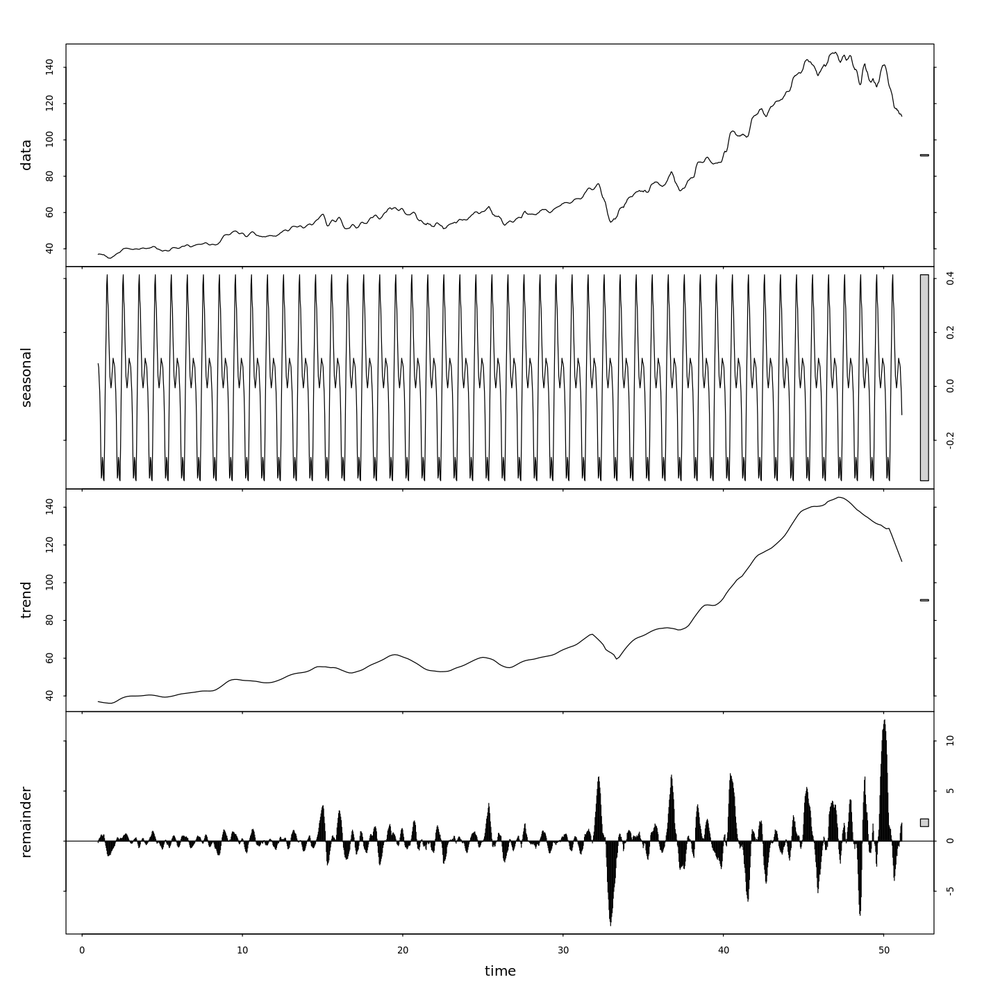

In [23]:
# TS decomposition

df$ma7 = ma(df$GOOGL.Adjusted, order=7)
price_ma = ts(na.omit(df$ma7), frequency=30)
decomp = stl(price_ma, s.window="periodic", robust = TRUE)
plot(decomp)

#As we can see, there does not seem to be any apparent periodicity in the Google stock price trades in our 8 months time period.

#### Autocorrelation and Partial Correlation<a class="anchor" id="section_4_3_3"></a>

Autocorrelation: The correlation between the series and its lags is called autocorrelation. Like correlation that measures the magnitude to which a linear relationship is associated between two variables, autocorrelation does the same between lagged values of a time series. If the series is considerably autocorrelated, it means that the impact of lags on forecasting the time series is high. In more general terms, a correlation factor of 1 (Lag = 1) conveys the correlation between values that are one period apart from each other. Likewise, lag ‘k’ autocorrelation shows the association amongst values that are ‘k’ time periods separately from each other.

Partial Autocorrelation: The purpose of partial autocorrelation is also like autocorrelation as it conveys the information about the relationship between a variable and its lag. But partial autocorrelation only delivers details about the pure association between the lag and disregards correlations that occur from intermediate lags.


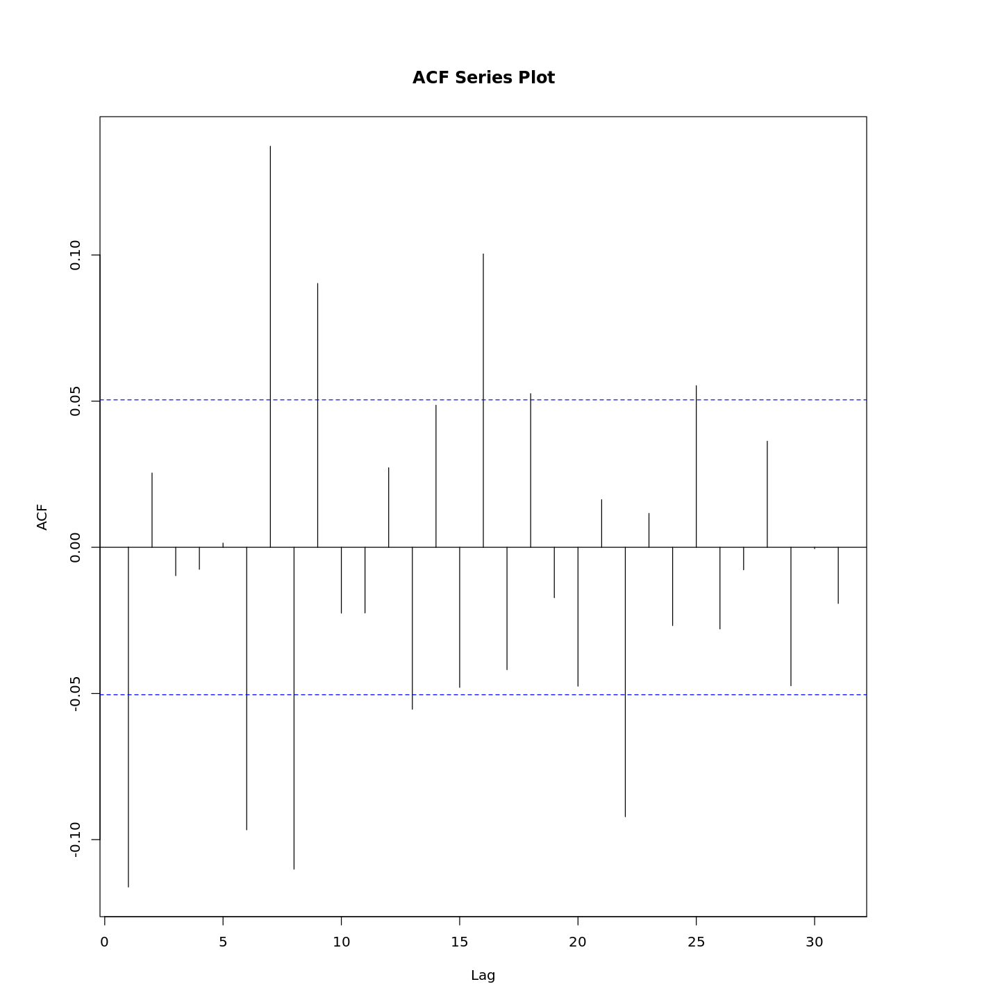

In [24]:
par(mar=c(5,6,7,8))
df = data.frame(date = index(data), data, row.names=NULL)
series = df$GOOGL.Close
Acf(
  series,
  lag.max = NULL,
  type = c("correlation", "covariance", "partial"),
  plot = TRUE,
  na.action = na.contiguous,
  demean = TRUE,
  main = "ACF Series Plot"
)

#While reading data from the ACF plot for Apple, we see a gradual decay in the lags. 
#This decay is an indication of significant closing values at each time interval confirming 
#that our hypothesis from the Augmented Dickey Fuller test was correct.


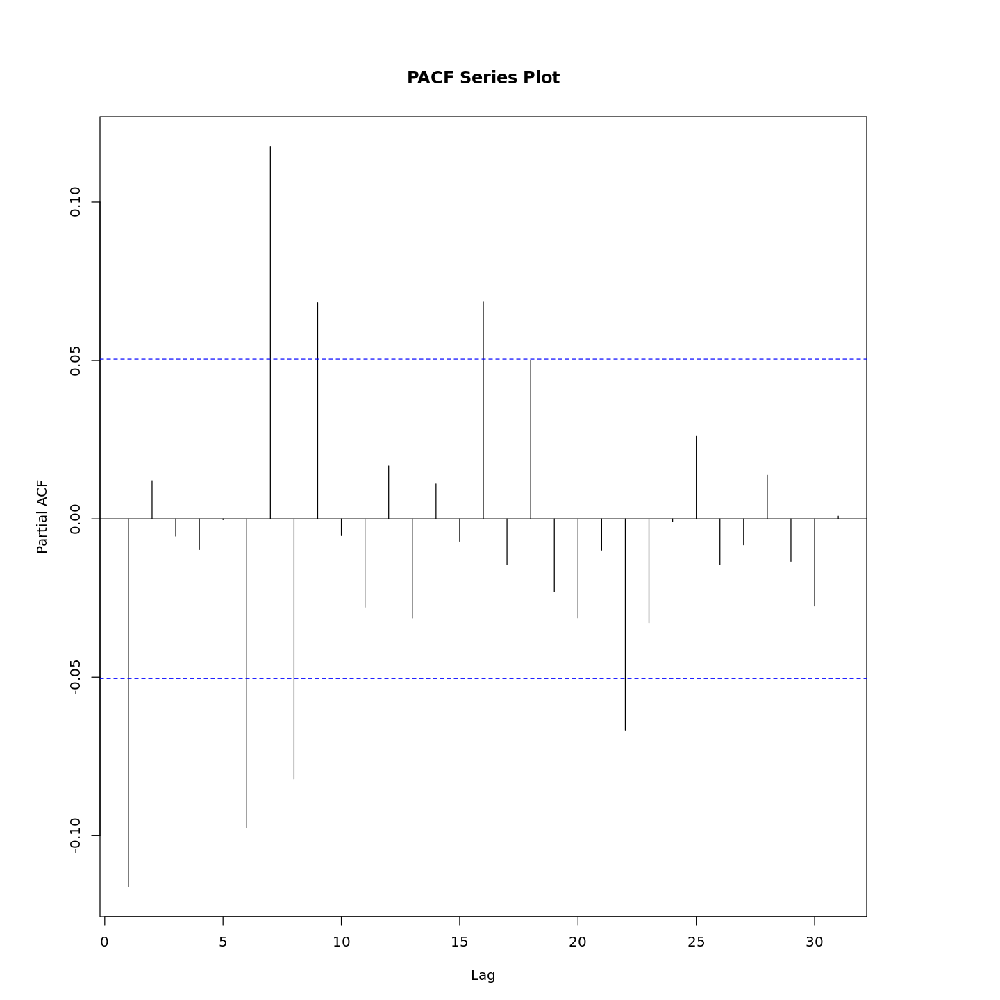

In [25]:
par(mar=c(5,6,7,8))
df = data.frame(date = index(data), data, row.names=NULL)
series = df$GOOGL.Close
Pacf(
  series,
  lag.max = NULL,
  plot = TRUE,
  na.action = na.contiguous,
  demean = TRUE,
  main = "PACF Series Plot"
)

#While reading the PACF plot for Apple, we notice that the lag order is high at the start but then moves 
#in geometric progression throughout the timeline. 
#The periodic changing movements in the lag of the PACF plot confirm that this is the seasonal component 
#of data and any changing prices can be used to build the ARIMA model. 
#Had this been a flat line across all time frames, this data would not have yielded any results in the ARIMA forecast.


#### ARIMA - Autoregresive Integrating Moving Average<a class="anchor" id="section_4_3_4"></a>

A general term in the statistics and economics world, auto regressive integrated moving average (ARIMA) is used to describe a moving average construct. These have found great interest in building Time Series forecasting models.

ARIMA models are applied to instances where the input data shows evidence of non-stationarity in the sense of mean, but there is no significant variance observed.

We can break the definition of ARIMA as follows, the AR part of ARIMA stands for an evolving variable that is regressed on its self-lag (old values). The MA part shows the regression error that is a linear combination of error terms that have occurred at various times in the past. The remaining “I” (integrated) indicated that the data got replaced with differences between current and previous values. These individual processes may have to be performed multiple times. The purpose of each of these features is to make the model fit the data as well as possible.


Series: df$GOOGL.Close 
ARIMA(1,0,0) with non-zero mean 

Coefficients:
          ar1   mean
      -0.1163  7e-04
s.e.   0.0256  4e-04

sigma^2 = 0.0002856:  log likelihood = 4020.01
AIC=-8034.02   AICc=-8034   BIC=-8018.06

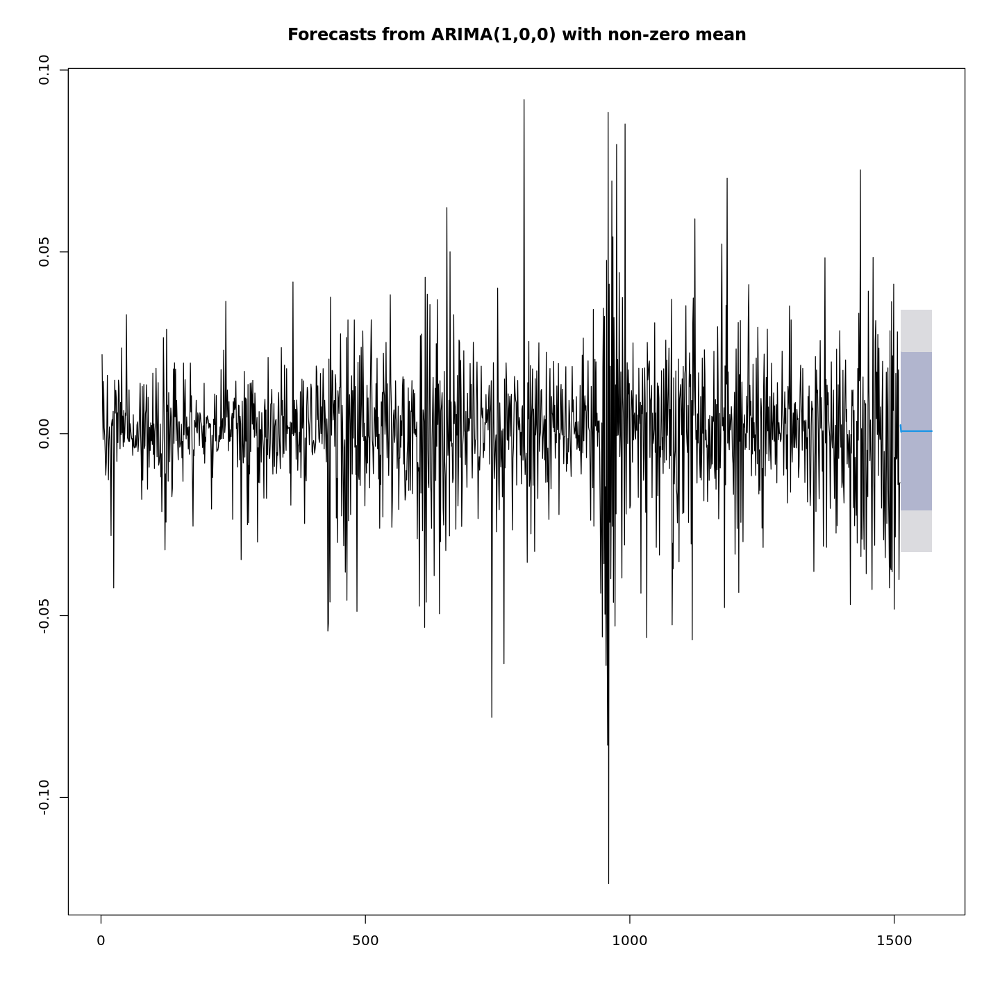

In [26]:
modelfit <- auto.arima(df$GOOGL.Close, stepwise = TRUE, lambda = NULL)
modelfit

#Now that our model is ready, we will forecast the prices for the next 60 days.

price_forecast <- forecast(modelfit, h=60)
plot(price_forecast)

#The above prediction can be read as follows: 
#1. The blue line represents the mean of our prediction. 
#2. The darker shaded region around the blue line represents an 80% confidence interval.
#3. The light shaded outer portion represents a 95% confidence interval.

#### Comparing predictions with Actual Stock Prices<a class="anchor" id="section_4_3_5"></a>

To conclude the predictive analytics tutorial, let us match out our generated predictions to the real stock closing prices from 2021-10-10, to 2021-10-31.

Series: df$GOOGL.Close 
ARIMA(3,1,2) with drift 
Box Cox transformation: lambda= 0.609303 

Coefficients:
         ar1      ar2      ar3      ma1     ma2   drift
      1.3121  -0.7350  -0.1532  -1.4591  0.9473  0.0131
s.e.  0.0547   0.0597   0.0337   0.0472  0.0362  0.0068

sigma^2 = 0.05918:  log likelihood = -1.99
AIC=17.99   AICc=18.11   BIC=51.76

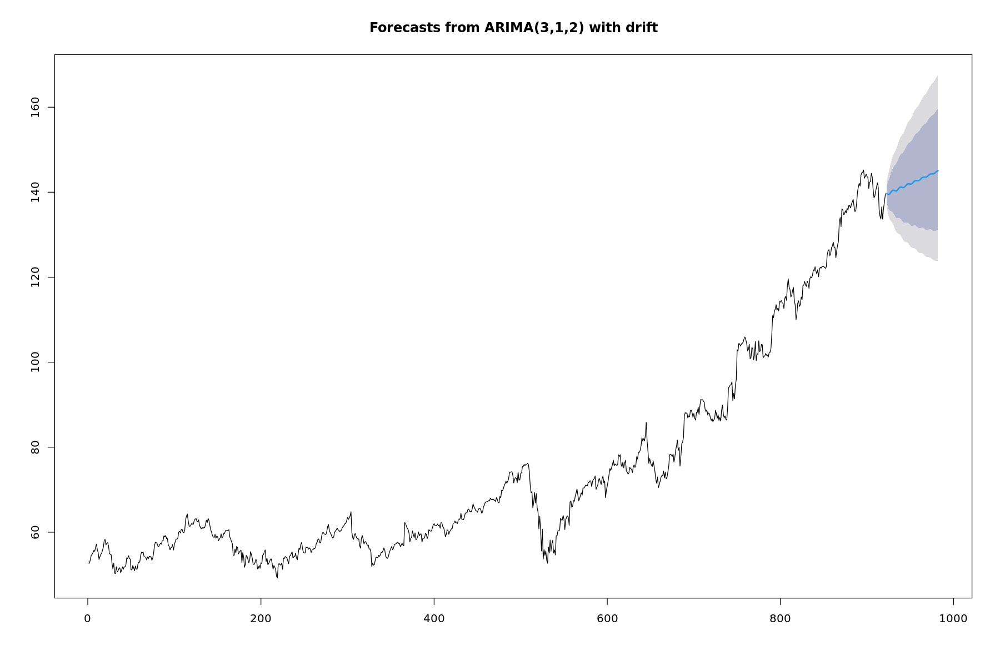

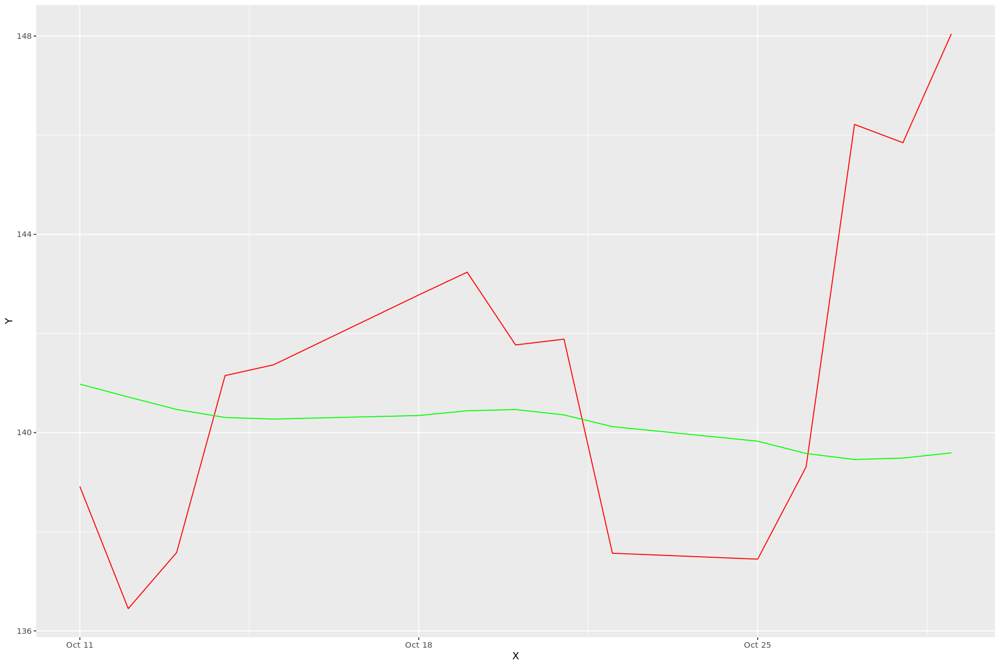

In [88]:
data <- getSymbols("GOOGL", src="yahoo", from="2018-02-10", to="2021-10-10", auto.assign=FALSE)
df = data.frame(date = index(data), data, row.names=NULL)

modelfit <- auto.arima(df$GOOGL.Close, stationary = FALSE, seasonal = TRUE, stepwise = FALSE, trace = FALSE,
                       approximation = FALSE, allowmean = TRUE, lambda = "auto")
modelfit

price_forecast <- forecast(modelfit, h=60)
plot(price_forecast)

data2 <- getSymbols("GOOGL", src="yahoo", from="2021-10-10", to="2021-10-31", auto.assign=FALSE)
df2 = data.frame(date = index(data2), data2, row.names=NULL)
present <- as.vector(df2$GOOGL.Close)

meanvalues <- as.vector(price_forecast$mean)

x  <- df2$date
y1 <- present
y2 <- meanvalues[15:1]
df_new <- data.frame(x,y1,y2)
g <- ggplot(df_new, aes(x))
g <- g + geom_line(aes(y=y1), colour="red")
g <- g + geom_line(aes(y=y2), colour="green")
g <- g + ylab("Y") + xlab("X")
g

Our prediction is for the next 30 days based on data from the last 8 months, previously we used data from the last 20 days, more data we gather closer the prediction will be to the actual historical changes.

The previous entries are not going to match, but as we converge towards the end of the graph, if the numbers start coming into the same pattern of movement,
that is a positive sign. 

## Building a Portfolio of Stocks<a class="anchor" id="chapter5"></a>

#### How to decide what percentage of your portfolio should be invested where?

In managing finances, it is common knowledge that diversification yields better results.
The idea is to not put all your eggs in one basket. So then how do you decide which baskets to choose and how to allocate funds?


### Sharpe Ratio <a class="anchor" id="Section_5_1"></a>

An important construct in deciding the best outcome of trading more than one stock is calculating the sharpe ratio. It tells you which pair and what percentage of fund allocation to which stock will yield the best outcome.

We will assume 0% risk free rate to calculate the Sharpe Ratio.

$$
Portfolio Sharpe Ratio = \frac{E[P]}{\sqrt{Var[P]}}
$$

There are many interpretations of the Sharpe ratio. It can be considered a stability metric. If it’s high, it means that the average return is higher than the variance, so the returns are quite stable around the mean value.
The goal as investors is to reach the highest stability of portfolio, not the highest profit.

In the function below we will complete a few prerequisite steps to calculate the Sharpe Ratio:

1. Bring data for 3 stocks, historical data for the last 1.5 years.
2. Calculate their respective monthly return rates to summarize which stock gave what returns.
3. Merge their return into one data frame to further divide portions of the portfolio.

In [28]:
returns <- function(ticker, start_year) {
  symbol <- getSymbols(ticker, src = 'yahoo', auto.assign = FALSE, warnings = FALSE)
  data <- periodReturn(symbol, period = 'monthly', subset=paste(start_year, "::", sep = ""), type = 'log')
  colnames(data) <- as.character(ticker)
  assign(ticker, data, .GlobalEnv)
}
returns('GOOGL', 2021)
returns('AMZN', 2021)
returns('TSLA', 2021)
merged_returns <- merge.xts(GOOGL, AMZN, TSLA)

In [29]:
#Returns Plot
dygraph(merged_returns, main = "GOOGLE v/s AMAZON v/s TESLA") %>%
  dyAxis("y", label = "Return Percentage") %>%
  dyOptions(colors = RColorBrewer::brewer.pal(3, "Set2"))

#The interactive line chart above shows us the individual return rates of the three stocks.
#It is evident that Tesla is the most volatile stock of the three.
#It is grown the largest, but at times has also shed losses in large numbers.
#At this moment, it looks like investing in TSLA could yield high results but comes with very high risk-ratio as well.


HTML widgets cannot be represented in plain text (need html)

In [30]:
#Building the Portfolio
percAlloc <- c(.25, .25, .50)
portfolio_returns <- Return.portfolio(merged_returns, weights = percAlloc)
dygraph(portfolio_returns, main = "Portfolio Monthly Return") %>%
  dyAxis("y", label = "Return Percentage")

HTML widgets cannot be represented in plain text (need html)

For starting the calculation of Sharpe Ratio, I have split my portfolio as follows:
1. Google - 25%
2. Amazon - 25%
3. Tesla - 50%

This division is instinctive and does not come from any sort of calculation.
You are free to experiment these based on how much risk you would like to add to your portfolio.
Modification of these values will result in changes to the Sharpe Ratio.



In [31]:
dollar_growth <- Return.portfolio(merged_returns, weights = percAlloc, wealth.index = TRUE)
dygraph(dollar_growth, main = "Growth of $1 Invested in Portfolio") %>%
  dyAxis("y", label = "Dollor Return on 1$ investment")

HTML widgets cannot be represented in plain text (need html)

Now, for the purpose of this analysis, imagine I invested one dollar in this portfolio based on the allocations I have mentioned above. 

The dygraph above shows what would be the return on investment of 1 dollar on this portfolio. We can observe the superior rise post 2022 that goes upto a 6-fold increase on the overall returns. 


#### Portfolio Sharpe Ratio<a class="anchor" id="section_5_1_1"></a>

In [32]:
sharpe_ratio <- round(SharpeRatio(portfolio_returns, Rf = .0003), 4)
sharpe_ratio

,portfolio.returns
"StdDev Sharpe (Rf=0%, p=95%):",0.0448
"VaR Sharpe (Rf=0%, p=95%):",0.0294
"ES Sharpe (Rf=0%, p=95%):",0.0239


#### Improving the Sharpe Ratio<a class="anchor" id="section_5_1_2"></a>

Could this score have been better?

To maximize this score there are multiple ways. Either we can export all this data to Excel and run a What-If analysis to find what percentage allocation would maximize the sharpe ratio. Or we could manually change the percentage allocation in the 'percAlloc' variable created above. The higher the score, the better the portfolio. 

We are going to test a genetic algorithm to improve the resources allocation in the portfolio, we will use Sharpe ratio maximization for its simplicity.

### The penalty function method  <a class="anchor" id="Section_5_2"></a>

When we want to build an investment portfolio, we want to mix many assets together allocating a fraction $x$ of our capital to each one of them. Each fraction is called weight. The sum of those weights has to be 1 to cover the entire capital we want to invest.

It could be useful to transform this constrained problem in an unconstrained optimization problem.

Let’s suppose we want to optimize (i.e. minimize) a generic f(x) function subjected to some constraints. In order to make the constraints disappear explicitly from our problem, we can create a new function that penalizes all the points in the function domain that don’t satisfy the constraints.

Since we are facing an optimization problem, the simpler way to do it is adding a positive penalty to the original f(x) for all the points outside the constraints. With this trick, the only way we can find the global minimum is by the satisfaction of the constraints.

#### Building the penalty function according to the constraints<a class="anchor" id="section_5_2_1"></a>

When our constraint is an inequality in the form $g(x) < 0$, we can build a penalty function in the form $max(0,g(x))$. This way, if $g(x)$ is negative, the max function returns $0$, else it returns the value of $g(x)$ itself, increasing the value of the penalty function and discouraging the optimization. The higher the value of the penalty function, the further the global minimum is.

In order to keep our function reasonably differentiable, it’s useful to square it. So, our inequality constraints give us the following penalty functions:

$$
x_{i} < 1 \implies (max[0,x_i -1])^2
$$

$$
x_i > 0 \implies (max[0,-x_i])^2
$$

What about the sum constraint? It’s an equality constraint, which is simple to describe as a penalty function.

If we have a generic constraint in the form $f(x)-d=0$, we can easily build a quadratic form like this:

$$
f(x) - d = 0 \implies (f(x)-d)^2
$$

This function has an obvious global minimum when f(x)=d, which is exactly what we want.

So, the equality constraint becomes:

$$
\sum_{i=1}^{N} x_i = 1 \implies (\sum_{i=1}^{N}x_i-1)^2
$$

For the final function, we want to emphasize the constraints in the optimization procedure. Our algorithm doesn’t know of the unconstrained problem, so it’s useful to force the global minimum search multiplying the penalty function by a factor, I multiplied it by 100, in order to enhance the optimization process.

Finally, the function we want to optimize is the Sharpe ratio with minus sign. We want to maximize Sharpe ratio, but the penalty function formalism seen so far works only for functions to be minimized, so we can multiply Sharpe ratio by -1 in order to transform a maximization problem in a minimization problem.

The final function we have to minimize is then:

$$
-Sharpe({x_i}) + 100[(\sum_{i=1}^{N}x_i-1)^2 + \sum_{i=1}^{N} (max[0,x_i -1])^2 + \sum_{i=1}^{N} (max[0,-x_i])^2]
$$

### Genetic algorithm  <a class="anchor" id="Section_5_3"></a>

Genetic algorithms follow the natural selection law but we are not going to inspect any further.

What it’s worth saying is that genetic algorithms are very useful because the random part of their process makes them work even with non-continuous or non-differentiable functions. 

Therefore, they can escape really well from local minima and go toward the global minimum, unlike deterministic methods like the Gradient Descent.

In [33]:
returns <- function(ticker, start_year) {
  symbol <- getSymbols(ticker, src = 'yahoo', auto.assign = FALSE, warnings = FALSE)
  data <- periodReturn(symbol, period = 'daily', subset=paste(start_year, "::", sep = ""), type = 'log')
  colnames(data) <- as.character(ticker)
  assign(ticker, data, .GlobalEnv)
}
returns('GOOGL', 2016)
returns('AMZN', 2016)
returns('INTC', 2016)
returns('TSLA', 2016)
returns('AAPL', 2016)
merged_returns1 <- merge.xts(GOOGL, AMZN, INTC, TSLA, AAPL)
merged_returns <- as.data.frame(merged_returns1)

#### Portfolio returns<a class="anchor" id="section_5_3_1"></a>

Portfolio historical returns are a function of the weights. Remember that historical data is always the same and what we want to do is to find an optimal portfolio changing the weights values.

We can define portfolio returns time series in function of the weights by multiplying each asset return by the weight related to it. Then we can sum all the weighted time series element by element.

We can define a portfolio_returns function that does this job. It’s a function of an array x of weights.

In [34]:
portfolio_returns = function(x) {
  port.returns = 0
  
  # Multiplication of the i-th asset by the i-th weight in "x"
  for (i in 1:length(x)) {
    port.returns = port.returns + merged_returns[,i] * x[i]
  }
  
  return (port.returns)
}

#### Objective function with penalty<a class="anchor" id="section_5_3_2"></a>

First of all, we have to calculate the Sharpe ratio on the historical weighted portfolio returns.

In [35]:
sharpe = function(x) {
  port.returns = portfolio_returns(x)
  
  return (mean(port.returns)/sqrt(var(port.returns)))
  
}

Now we have to write the code for the penalty function. We can write a constraint function that implements all the constraints.

In [36]:
constraint = function(x) {
 boundary_constr = (sum(x)-1)**2   # "sum x = 1" constraint
 
 for (i in 1:length(x)) {
  boundary_constr = boundary_constr + 
     max(c(0,x[i]-1))**2 +  # "x <= 1" constraint
     max(c(0,-x[i]))**2     # "x >= 0" constraint
 }
 
 return (boundary_constr)
}

Finally, we write our objective function to be optimized.

In [37]:
obj = function(x) {
  # We want the maximum Sharpe ratio, so we multiply it by
  # -1 to fit an optimization problem
  
  return (-sharpe(x)+100*constraint(x))
}

#### Optimization <a class="anchor" id="section_5_3_3"></a>

Now for the optimization procedure. R has a general purpose Genetic Algorithm library called “GA”, which can be used for many optimization problems.

Remember: the goal is to find the values of the weights that maximize the Sharpe ratio according to the constraints.

The GA function in R is a simple but effective genetic algorithm implementation for solving maximization problems.

I configured the genetic optimization in order to make it perform at most 50.000 iterations, stopping only if the maximum fitness doesn’t change for 100 consecutive iterations. This is our stopping criterion for the genetic algorithm.

In [38]:
ga_res = ga(
      # Tell the genetic algorithm that the 
      # weights are real variables
      type="real-valued", 
      
      # "ga" function performs maximization, so we must
      # multiply the objective function by -1
      function(x){-obj(x)}, 
      
      # x_i >= 0
      lower = rep(0,ncol(merged_returns)), 
      
      # x_i <= 1
      upper = rep(1,ncol(merged_returns)), 
      
      # Maximum number of iterations 
      maxiter = 50000, 
      
      # If the maximum fitness remains the same for 50
      # consecutive transactions, stop the algorithm
      run=100, 
      
      # Exploit multi-core properties of your CPU
      parallel=TRUE,
      
      # We want to see the partial results of the process
      # while it performs
      monitor=TRUE,
      
      # Seed useful for replicating the results
      seed=12345
)

GA | iter = 1 | Mean = -347.71720 | Best =  -29.11754
GA | iter = 2 | Mean = -206.49751 | Best =  -16.46302
GA | iter = 3 | Mean = -131.0189429 | Best =   -0.7209537
GA | iter = 4 | Mean = -93.2907930 | Best =  -0.7209537
GA | iter = 5 | Mean = -75.60310670 | Best =   0.03169566
GA | iter = 6 | Mean = -60.02369857 | Best =   0.03169566
GA | iter = 7 | Mean = -44.01013598 | Best =   0.03169566
GA | iter = 8 | Mean = -25.15306684 | Best =   0.03169566
GA | iter = 9 | Mean = -16.72826396 | Best =   0.03169566
GA | iter = 10 | Mean = -10.10112238 | Best =   0.03169566
GA | iter = 11 | Mean = -6.29483390 | Best =  0.03169566
GA | iter = 12 | Mean = -8.47712059 | Best =  0.04402774
GA | iter = 13 | Mean = -5.02942022 | Best =  0.04402774
GA | iter = 14 | Mean = -4.40750426 | Best =  0.04692462
GA | iter = 15 | Mean = -9.39425740 | Best =  0.04692462
GA | iter = 16 | Mean = -4.39390472 | Best =  0.04692462
GA | iter = 17 | Mean = -4.7080179 | Best =  0.0494909
GA | iter = 18 | Mean = -4.70519

Optimization procedure may take a few minutes, depending on the speed of the CPU.

In [39]:
summary(ga_res)

── Genetic Algorithm ─────────────────── 

GA settings: 
Type                  =  real-valued 
Population size       =  50 
Number of generations =  50000 
Elitism               =  2 
Crossover probability =  0.8 
Mutation probability  =  0.1 
Search domain = 
      x1 x2 x3 x4 x5
lower  0  0  0  0  0
upper  1  1  1  1  1

GA results: 
Iterations             = 882 
Fitness function value = 0.05831018 
Solution = 
            x1        x2         x3        x4       x5
[1,] 0.1559227 0.1912991 0.01451775 0.2766541 0.362763

In [40]:
# Store the resulting weights in a vector
percentage_alloc = as.vector(summary(ga_res)$solution)
# read their values near the names of our assets
cbind(names(merged_returns),percentage_alloc)

,percentage_alloc
GOOGL,0.155922669336929
AMZN,0.191299055790333
INTC,0.014517753909013
TSLA,0.276654069202392
AAPL,0.362762962133982


According to these weights, we should allocate 15.6% of our capital on Google stocks, 19.1% on Amazon and so on.

In [41]:
sum(percentage_alloc)

[1] 1.001157

As you can see, each weight is positive and more than 1 and their sum is 1.001, which is pretty close to 1 as we wanted.
Numerical methods have a physiological inaccuracy that can be controlled in order to fit your problem needs.

Now we can plot the historical returns of the weighted portfolio versus the historical returns of the single assets.

In [42]:
returns('SP', 2016)
SP_returns <- merge.xts(SP)
SP_returns <- as.data.frame(SP_returns)

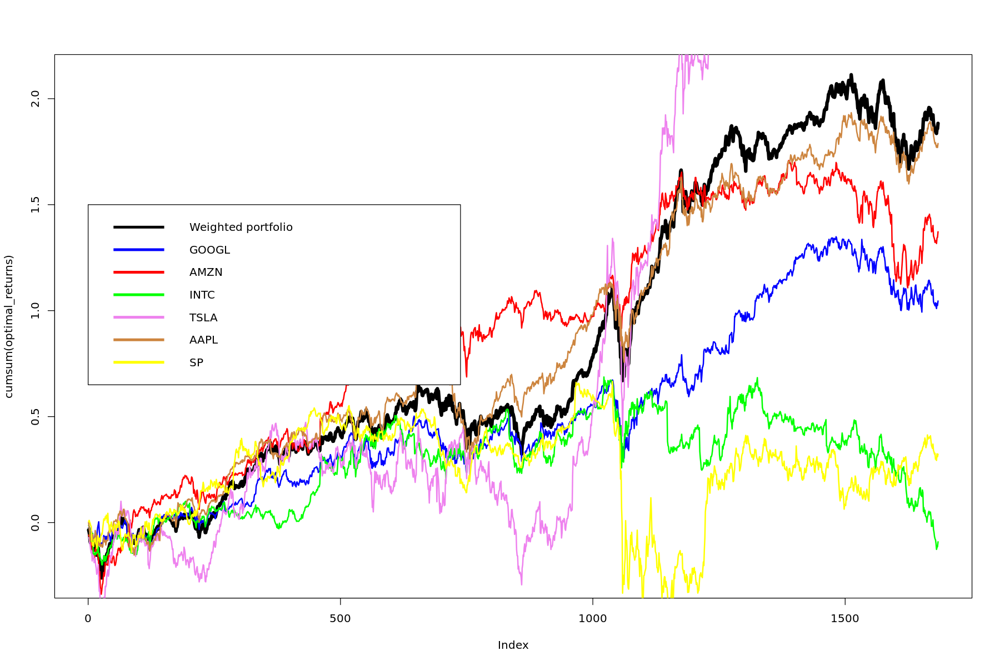

In [43]:
options(repr.plot.width=15, repr.plot.height=10)

optimal_returns = portfolio_returns(percentage_alloc)

plot(cumsum(optimal_returns),type="l",lwd=5)

lines(cumsum(merged_returns[,1]),col="blue",lwd=2)
lines(cumsum(merged_returns[,2]),col="red",lwd=2)
lines(cumsum(merged_returns[,3]),col="green",lwd=2)
lines(cumsum(merged_returns[,4]),col="violet",lwd=2)
lines(cumsum(merged_returns[,5]),col="peru",lwd=2)
lines(cumsum(SP_returns[]),col="yellow",lwd=2)

legend(0,1.5,legend=c("Weighted portfolio",names(merged_returns),names(SP_returns)),
       col = c("black","blue","red","green","violet","peru","yellow"),lty=1, lwd=4)


#as.factor(rownames(merged_returns))

As you can see, the portfolio return (black thick line) is the most stable curve, although it’s not the best performing one in the last period (Tesla performs better). It’s nice to see that our portfolio outperforms S&P 500 (yellow).

## Conclusion, Summary and Learnings <a class="anchor" id="chapter6"></a>

In this project we covered increasingly complicated data visualisation approaches, that is a very important tool for any data analytics project, meant to provide useful statistical analysis for the financial market.

The project aimed at creating a stock price evolution predictor on R, by simply studying historical stock price data, time series and building predictions throught Random Walk, Monte Carlo simulations and ARIMA.

In the second section of the paper I have dealt with some issues in portfolio optimisation strategies, from the naive built of a portfolio of stocks to the introduction of the penalty function method in order to perform a portfolio optimization algorithm.

The method involved here is flexible enough to be used with other objective functions (e.g. Sortino ratio), it can be improved by the use of a deterministic optimization algorithm after the genetic algorithm, in order to reach a certain precision (e.g. gradient descent or any algorithm included in the optim R function).

We have performed an optimization without a cross validation, something should not be done in live trading.

### Bibliography  <a class="anchor" id="chapter7"></a>

* https://www.quantmod.com/whatsnext

* https://medium.com/@junko_hutahaean/modern-finance-portfolio-optimization-with-r-aa4a10becd78

* https://www.analyticsvidhya.com/blog/2020/11/stock-market-price-trend-prediction-using-time-series-forecasting/

* https://www.rstudio.com/wp-content/uploads/2015/03/ggplot2-cheatsheet.pdf

* http://www.business-science.io/investments/2016/11/30/Russell2000_Analysis.html

* https://medium.com/the-trading-scientist/portfolio-optimization-in-r-using-a-genetic-algorithm-8726ec985b6f

* https://www.r-bloggers.com/2016/05/a-gentle-introduction-to-finance-using-r-efficient-frontier-and-capm-part-1/

* https://www.portfolioprobe.com/2010/10/04/a-tale-of-two-returns/

* https://towardsdatascience.com/time-series-forecasting-predicting-stock-prices-using-an-arima-model-2e3b3080bd70